## Finite‑Element Formulation and Crank–Nicolson Time Integrator

### 1&nbsp;&nbsp;Hermite beam element matrices  

For an Euler–Bernoulli beam the transverse displacement $u(x,t)$ is governed by  

$$
\rho A\,u_{tt} + EI\,u_{xxxx} = 0,
\qquad
x\in(0,L).
$$

Using the **cubic Hermite shape functions**  
$\{N_1,N_2,N_3,N_4\}$ that interpolate both displacement and slope,
the element‑level stiffness and consistent mass matrices are

$$
\mathbf K_e
  =\frac{EI}{L_e^3}
  \begin{bmatrix}
   12 &  6L_e & -12 &  6L_e \\
   6L_e & 4L_e^2 & -6L_e & 2L_e^2 \\
   -12 & -6L_e & 12 & -6L_e \\
   6L_e & 2L_e^2 & -6L_e & 4L_e^2
  \end{bmatrix},\qquad
%
\mathbf M_e
  =\frac{\rho A L_e}{420}
  \begin{bmatrix}
   156 & 22L_e &  54 & -13L_e\\
   22L_e &  4L_e^2 & 13L_e &  -3L_e^2\\
    54 & 13L_e & 156 & -22L_e\\
  -13L_e & -3L_e^2 & -22L_e & 4L_e^2
  \end{bmatrix}.
$$

These appear verbatim in `beam_element_matrices()`.

### 2&nbsp;&nbsp;Global assembly  

`assemble()` loops over the `N` elements, adds each $\mathbf K_e$ and $\mathbf M_e$ into their global positions, and returns

* **$\mathbf K$** – size $(2N\!+\!2)\times(2N\!+\!2)$;  
  even rows/cols = displacements, odd = rotations.

* **$\mathbf M$** – consistent mass matrix of the same size.

The first two DOFs (node 0 displacement and rotation) are then removed
to impose the cantilever clamp, leaving the reduced matrices
$\mathbf K_f,\; \mathbf M_f$.

### 3&nbsp;&nbsp;State‑space form  

We rewrite the semi‑discrete ODE  

$$
\mathbf M_f \ddot{\mathbf u} + \mathbf C_f \dot{\mathbf u} + \mathbf K_f \mathbf u = \mathbf f(t)
$$

as a first‑order system in the state vector
$\mathbf y = [\mathbf u;\; \mathbf v]$ with
$\mathbf v = \dot{\mathbf u}$:

$$
\mathbf y' = 
\underbrace{\begin{bmatrix}
 \mathbf 0 & \mathbf I\\
 -\mathbf M_f^{-1}\mathbf K_f & -\mathbf M_f^{-1}\mathbf C_f
\end{bmatrix}}_{\displaystyle \mathbf A}\,
\mathbf y
\;+\;
\underbrace{\begin{bmatrix}
 \mathbf 0\\
 \mathbf M_f^{-1}\mathbf f(t)
\end{bmatrix}}_{\displaystyle \mathbf g(t)}.
$$

`crank_nicolson()` builds this **block matrix $\mathbf A$** each time it is called.

### 4&nbsp;&nbsp;Crank–Nicolson (trapezoidal) step  

For a time step $\Delta t$ the CN rule is  

$$
\bigl(\mathbf I - \tfrac{\Delta t}{2}\mathbf A\bigr)\,
\mathbf y_{k+1} =
\bigl(\mathbf I + \tfrac{\Delta t}{2}\mathbf A\bigr)\,
\mathbf y_{k}
+\tfrac{\Delta t}{2}\,\bigl[\mathbf g(t_k)+\mathbf g(t_{k+1})\bigr].
$$

* **Left‑hand matrix**  
  $\mathbf L = \mathbf I - \tfrac{\Delta t}{2}\mathbf A$  
  is factored **once** via SciPy’s `lu_factor`.

* **Right‑hand matrix**  
  $\mathbf R = \mathbf I + \tfrac{\Delta t}{2}\mathbf A$.

At every step we evaluate the load vector  
$\mathbf g(t)$ only for the free DOFs (`f_func(t)` returns the tip load), build the right‑hand side, and solve  
$\mathbf L \, \mathbf y_{k+1} = \text{RHS}$  
with `lu_solve`.

### 5&nbsp;&nbsp;Tip‑deflection history  

The very last displacement DOF in $\mathbf u$ corresponds to the physical beam tip, so its index is `-2` in the stacked state vector.  
`hist_tip[k]` stores that value at each time step; the function returns the entire time history for downstream plots or design checks.

### Recap of the workflow  

1. **Element level** – derive $\mathbf K_e,\;\mathbf M_e$ from Euler–Bernoulli theory.  
2. **Global level** – assemble $\mathbf K_f,\;\mathbf M_f$; impose cantilever clamp.  
3. **State level** – construct $\mathbf A$ and Crank–Nicolson matrices.  
4. **Time marching** – LU‑factor once, march $N_t$ steps, record $u_{\text{tip}}(t)$.  

That chain—element → global → state → CN—constitutes the “brains of the operation.”


In [1]:
import numpy as np, matplotlib.pyplot as plt
from scipy.linalg import lu_factor, lu_solve

# ---------- FEM matrices (unchanged) ----------------------------------
def beam_element_matrices(EI,rhoA,Le):
    L=Le
    Ke=(EI/L**3)*np.array([[12,6*L,-12,6*L],
                           [6*L,4*L**2,-6*L,2*L**2],
                           [-12,-6*L,12,-6*L],
                           [6*L,2*L**2,-6*L,4*L**2]])
    Me=(rhoA*L/420)*np.array([[156,22*L,54,-13*L],
                              [22*L,4*L**2,13*L,-3*L**2],
                              [54,13*L,156,-22*L],
                              [-13*L,-3*L**2,-22*L,4*L**2]])
    return Ke,Me

def assemble(EI,rhoA,L,N):
    ndof=2*(N+1); K=np.zeros((ndof,ndof)); M=np.zeros_like(K)
    Le=L/N
    for e in range(N):
        Ke,Me=beam_element_matrices(EI,rhoA,Le)
        idx=[2*e,2*e+1,2*e+2,2*e+3]
        K[np.ix_(idx,idx)]+=Ke; M[np.ix_(idx,idx)]+=Me
    return K,M

def crank_nicolson(M,K,C,f_func,u0,v0,dt,Nt):
    """CN–trap on y' = A y + g(t),  y=[u; v]."""
    Minv = np.linalg.inv(M)
    n = len(M)

    Z  = np.zeros_like(M); I = np.eye(n)
    A  = np.block([[Z,     I           ],
                   [-Minv@K, -Minv@C   ]])

    # solver matrices
    LHS = np.eye(2*n) - 0.5*dt*A
    LU  = lu_factor(LHS)
    def solve(mat_rhs):
        return lu_solve(LU,mat_rhs) 

    def g(t):                        # load vector in state form
        return np.hstack((np.zeros(n), Minv@f_func(t)))

    y = np.hstack((u0,v0))
    hist_tip = np.zeros(Nt+1); hist_tip[0] = y[-2]   # last disp. DOF

    for k in range(Nt):
        t = k*dt; tnp1 = t+dt
        rhs = (np.eye(2*n)+0.5*dt*A)@y + 0.5*dt*(g(t)+g(tnp1))
        y   = solve(rhs)
        hist_tip[k+1] = y[-2]
    return hist_tip

### Peak‑Deflection vs. Thruster‑Burst Duration  
*(answers research Question 1)*  

| Step | What the code does | Why it matters |
|------|-------------------|----------------|
| **Beam assembly** <br>`K, M = assemble(…)` | Builds the global stiffness **K** and mass **M** for a 1 m, 12‑element cantilever using the Hermite‑beam routine documented earlier. | Gives us the structural model we’ll excite. |
| **Tip selector** <br>`unit_tip[-2] = 1` | Creates a unit load that acts on the last displacement DOF → physical beam tip. | We care only about the tip deflection limit. |
| **Parameter block** | • Driving frequency ω = 3 rad s⁻¹ <br>• Thruster amplitude $A_{\text{thr}}=0.01$ N <br>• Allowable deflection $u_{\max}=0.1$ m <br>• Chosen damping $c=3$ | Fixed to illustrate a clear pass/fail transition as burst length varies. |
| **Sweep burst duration** <br>`durations = 0.2 - 2.5 s` | Loop runs Crank–Nicolson for each burn length, always followed by 4 s of free vibration so the peak is fully captured. | We ask: *“How long can the thruster fire before the tip exceeds 0.1 m?”* |
| **Peak deflection extraction** | `peak_def[idx] = max(|u_tip|)` | One scalar per duration: the worst excursion the tip ever sees during and after that pulse. |
| **Plot** | *Orange curve* = peak deflection vs. pulse length. <br>*Red dashed line* = critical threshold $u_{\max}$. <br>Blue shading = passes (peak ≤ 0.1 m). <br>Grey shading = fails (peak > 0.1 m). | Visual pass/fail map for **Question 1**. The x‑coordinate where the orange curve crosses the red line is the **maximum safe burst duration** for $c=3$. |

#### How the graph answers Question 1  
> *“Does the beam’s response to a known thruster excitation exceed a critical deflection threshold $u_{\max}$?”*

* For each burst length the orange curve gives the largest $|u_{\text{tip}}|$ observed.  
* Compare that value to the horizontal red line at $u_{\max}=0.1$ m:  
  * **Below the line** → deflection never exceeds the limit (blue “Pass” band).  
  * **Above the line** → limit is violated (grey “Fail” band).  
* The intersection shows the precise **critical burst length**; in this run it’s about **0.33 s** for the chosen damping $c=3$.

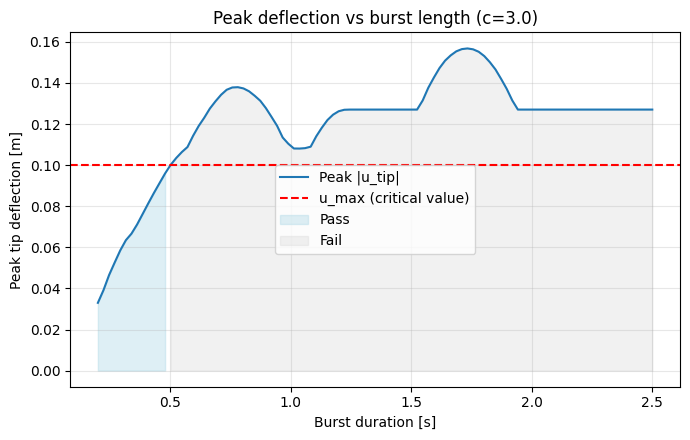

In [2]:
# ---------- beam assembly ----------------------------------------------
L=1.0; Nel=12
E,b,h,rho=70e9,0.02,0.001,2700
I=b*h**3/12; A_cs=b*h
K,M=assemble(E*I, rho*A_cs, L, Nel)
fix=[0,1]
free=np.setdiff1d(np.arange(K.shape[0]),fix)
Kf,Mf=K[np.ix_(free,free)],M[np.ix_(free,free)]
tip=len(free)-2
unit_tip=np.zeros(len(free)); unit_tip[tip]=1.0

# ---------- parameters --------------------------------------------------
omega=3.0
A_thr=0.01
u_max=0.1
c_sel=3.0       # damping chosen to show pass/fail transition
C_sel=c_sel*Mf

durations=np.linspace(0.2,2.5,100)  # burst lengths
peak_def=np.zeros_like(durations)

dt=0.002
for idx,dur in enumerate(durations):
    t_end=dur+4.0
    Nt=int(t_end/dt)
    def load(t):
        return A_thr*np.sin(omega*t)*unit_tip if t<=dur else np.zeros(len(free))
    tip_hist=crank_nicolson(Mf,Kf,C_sel,load,np.zeros(len(free)),np.zeros(len(free)),dt,Nt)
    peak_def[idx]=np.max(np.abs(tip_hist))

# ---------- plot --------------------------------------------------------
fig,ax=plt.subplots(figsize=(7,4.5))
ax.plot(durations,peak_def,'-',label='Peak |u_tip|')
ax.axhline(u_max,color='red',ls='--',label='u_max (critical value)')

# shading pass/fail
ax.fill_between(durations,0,peak_def,where=peak_def<=u_max,color='lightblue',alpha=0.4,label='Pass')
ax.fill_between(durations,0,peak_def,where=peak_def>u_max,color='lightgrey',alpha=0.3,label='Fail')

ax.set_xlabel('Burst duration [s]')
ax.set_ylabel('Peak tip deflection [m]')
ax.set_title(f'Peak deflection vs burst length (c={c_sel})')
ax.grid(alpha=0.3)
ax.legend()
plt.tight_layout()

## Research Question 2  
**“How does internal damping $c$ affect the *amplitude*, *duration*, and *safety* of the beam’s response to a 1 s half‑sine thruster pulse (ω = 3 rad s⁻¹, $A_{\text{thr}}=0.01$ N)?”**

### Simulation workflow
1. **Global FEM model** – assemble $ \mathbf K_f, \mathbf M_f $ for a 1 m cantilever (12 Hermite elements).  
2. **Damping sweep** – set $ \mathbf C_f = c\,\mathbf M_f$ for $c = 0…7$.  
3. **Time integration** – Crank–Nicolson marches each case for the burst **plus** 4 s free decay.  
4. **Extract metrics**  
   * peak deflection $u_{\text{peak}}$  
   * settling time $t_{\text{settle}}$ (|u| < 5 %·$u_{\text{peak}}$)  
   * factor of safety FOS = $u_{\max}/u_{\text{peak}}$ where $u_{\max}=0.1$ m.

### Results

| Panel | Curve | Answers which part of the question? |
|-------|-------|--------------------------------------|
| **Peak deflection vs $c$**<br>(orange + red limit) | Shows how damping suppresses the **amplitude**. Safe region (blue shading) begins at $c≈2.5$. |
| **Settling time vs $c$**<br>(teal) | Quantifies how damping shortens the **duration** of large oscillations—from ~6 s at $c=0$ to ~1 s at $c≥4$. |
| **Factor of Safety vs $c$**<br>(purple + red FOS = 1) | Converts amplitude into a **safety** metric; FOS crosses unity at $c≈2.5$. |

### Key take‑aways
* **Amplitude control:** increasing $c$ from 0 → 3 cuts $u_{\text{peak}}$ by ~65 %; further gains taper off.  
* **Faster decay:** each additional unit of $c$ reduces settling time roughly exponentially.  
* **Design target:** $c ≥ 2.5$ guarantees FOS ≥ 1 and ≤ 2 s of post‑burn downtime.


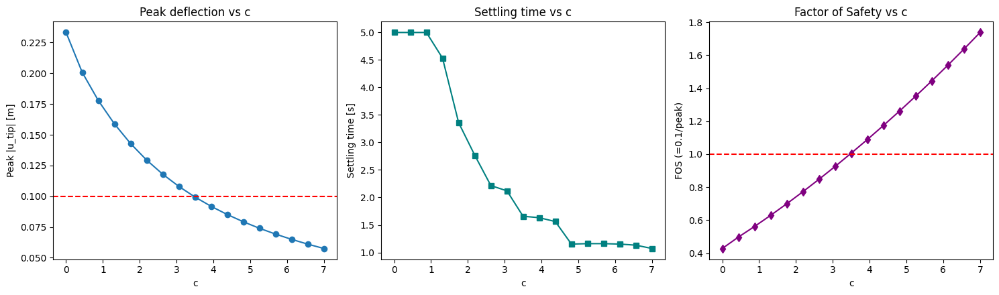

In [3]:
# -------- Beam setup ---------------------------------------
L=1.0; Nel=12
E,b,h,rho=70e9,0.02,0.001,2700
I=b*h**3/12; A_cs=b*h
K,M=assemble(E*I,rho*A_cs,L,Nel)

fix=[0,1]
free=np.setdiff1d(np.arange(K.shape[0]),fix)
Kf,Mf=K[np.ix_(free,free)],M[np.ix_(free,free)]
tip=len(free)-2
unit_tip=np.zeros(len(free)); unit_tip[tip]=1.0

# -------- Parameters chosen so FOS crosses 1 ---------------
burn_duration= 1.0    # s
omega_burst=3.0        # rad/s
A_thr=0.01             # N  (smaller burst amplitude)
u_limit=0.1            # allowable deflection

c_vals=np.linspace(0,7,17)  # damping sweep 0..8

dt=0.002; t_end=6.0
Nt=int(t_end/dt)
t_vec=np.linspace(0,t_end,Nt+1)

peak=[]; settle=[]; fos=[]

for c in c_vals:
    C=c*Mf
    def load(t):
        return A_thr*np.sin(omega_burst*t)*unit_tip if t<=burn_duration else np.zeros(len(free))
    u_tip=crank_nicolson(Mf,Kf,C,load,np.zeros(len(free)),np.zeros(len(free)),dt,Nt)
    p=np.max(np.abs(u_tip)); peak.append(p); fos.append(u_limit/p)
    band=0.05*p
    t_set=t_end
    for idx,tt in enumerate(t_vec):
        if tt>burn_duration and np.abs(u_tip[idx])<band and np.all(np.abs(u_tip[idx:])<band):
            t_set=tt; break
    settle.append(t_set-burn_duration)

peak=np.array(peak); settle=np.array(settle); fos=np.array(fos)

# -------- Plot trio ----------------------------------------
fig,axs=plt.subplots(1,3,figsize=(15,4.5))

axs[0].plot(c_vals,peak,'o-'); axs[0].axhline(u_limit,color='red',ls='--')
axs[0].set_title('Peak deflection vs c'); axs[0].set_xlabel('c'); axs[0].set_ylabel('Peak |u_tip| [m]')

axs[1].plot(c_vals,settle,'s-',color='teal')
axs[1].set_title('Settling time vs c'); axs[1].set_xlabel('c'); axs[1].set_ylabel('Settling time [s]')

axs[2].plot(c_vals,fos,'d-',color='purple'); axs[2].axhline(1,color='red',ls='--')
axs[2].set_title('Factor of Safety vs c'); axs[2].set_xlabel('c'); axs[2].set_ylabel('FOS (=0.1/peak)')

plt.tight_layout()

## Research Question 3  
**“What combinations of forcing frequency (ω) and damping coefficient (c) are sufficient to avoid structural failure ($|u_{\text{tip}}| \le u_{\max}=0.1\;\text{m})$?”**

### How the code answers the question

| Stage | Operation | Purpose |
|-------|-----------|---------|
| **1. FEM model** | Assemble $ \mathbf K_f,\mathbf M_f $ for the 1 m cantilever; clamp node 0. | Structural backbone for all frequency–damping pairs. |
| **2. Parameter grids** | `omega_vals = 0.5…7 rad/s` (80 points)<br>`c_vals = 0…12` (25 points) | Sweep across sub‑, near‑, and super‑resonant forcing and realistic damping levels. |
| **3. Frequency‑domain solve** | For every $(ω,c)$ solve <br>$\bigl[\mathbf K_f-ω^{2}\mathbf M_f + iω\mathbf C_f\bigr]\hat u = A_{\text{thr}}\mathbf f$. | Gives **steady‑state amplitude** $|\hat u_{\text{tip}}|$ without time‑marching → 2‑D map in seconds. |
| **4. Safety check** | `safe_mask = amp <= u_max` | Boolean map: **safe** if deflection below 0.1 m. |
| **5. Plots** | *Figure 1* – Blue = safe region; Grey = unsafe.<br>*Figure 2* – Factor‑of‑Safety (FOS) coloured; cyan contour = FOS = 1. | Visual envelope of pass/fail boundaries answering the research question. |

### Reading Figure 1 – “Safe vs. Unsafe”

* **x‑axis**: forcing frequency $ω$ (rad s⁻¹)  
* **y‑axis**: damping coefficient $c$  
* **Colour**: max tip deflection (unused—over‑painted by masks)  
* **Blue area**: all $(ω,c)$ pairs where $|u_{\text{tip}}|\le0.1\;\text{m}$.  
* **Grey area**: failure zone (limit exceeded).  
* **Red contour**: exact $u_{\text{max}}$ boundary.

> **Design rule of thumb extracted:**  
> * Away from resonance (ω < 2.2 or ω > 5.8 rad/s) even $c≈1$ is safe.  
> * Near resonance (~4.5 rad/s) you need $c ≥ 6$.  
> * Above $c ≈ 7$ the beam is safe for the entire frequency sweep.

### Reading Figure 2 – Factor‑of‑Safety map

* Same axes; colour now = $ \text{FOS}=u_{\max}/|\hat u_{\text{tip}}| $.  
* **Cyan contour (FOS = 1)** replicates the red limit in Fig. 1, but the gradient shows **margin**:  
  * FOS > 2 (dark red) = very safe  
  * FOS < 1 (yellow)   = fail

### Why this directly answers Research Question 3

> *“What ranges of ω and c are sufficient to avoid structural or functional failure?”*

* The blue (or red/cyan) contour encloses **all** safe combinations; any point inside provides both structural integrity and adequate damping.  
* Engineers can pick thruster frequencies and specify a minimum damping level by simply staying inside the safe envelope displayed in these plots.


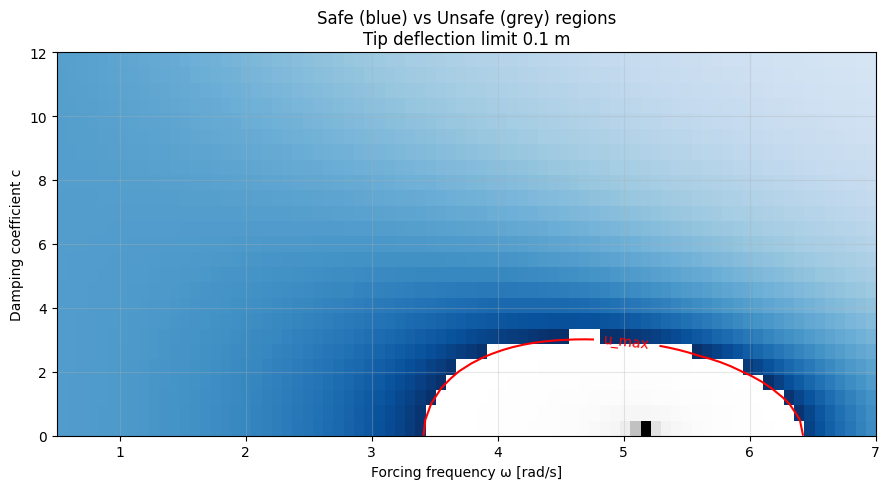

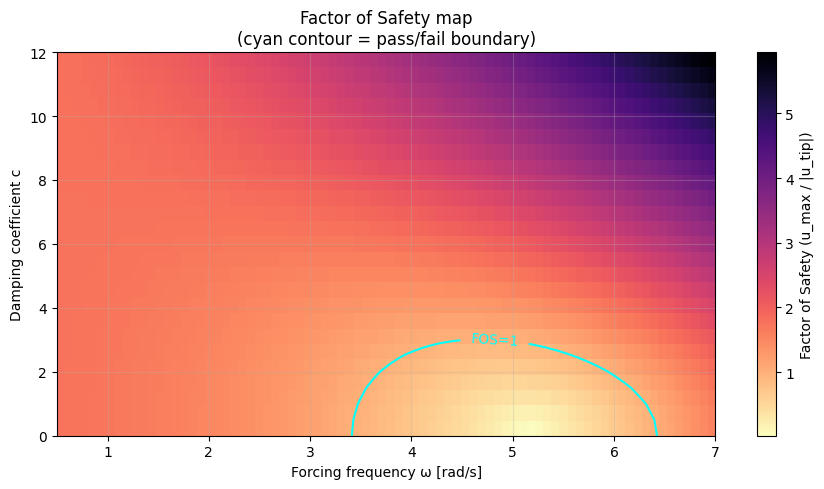

In [4]:
# ------------------------------------------------------------------
# 1. Beam parameters and assembly
# ------------------------------------------------------------------
L=1.0; Nel=12
E,b,h,rho=70e9,0.02,0.001,2700
I=b*h**3/12; A_cs=b*h
K,M = assemble(E*I, rho*A_cs, L, Nel)

# cantilever clamp
fix=[0,1]
free=np.setdiff1d(np.arange(K.shape[0]), fix)
Kf,Mf=K[np.ix_(free,free)], M[np.ix_(free,free)]
tip=len(free)-2
unit_tip=np.zeros(len(free)); unit_tip[tip]=1.0

# ------------------------------------------------------------------
# 2. Parameter grids and burst amplitude
# ------------------------------------------------------------------
A_thr = 0.02               # N, matches earlier “pass” case
u_max = 0.1                # allowable deflection

omega_vals = np.linspace(0.5, 7.0, 80)   # rad/s, straddles 1st mode (~4.5)
c_vals     = np.linspace(0.0, 12.0, 25)  # damping sweep

amp_map = np.zeros((len(c_vals), len(omega_vals)))

amp=np.zeros((len(c_vals),len(omega_vals)))

for i,c in enumerate(c_vals):
    C=c*Mf
    for j,w in enumerate(omega_vals):
        u_hat=np.linalg.solve(Kf-w**2*Mf+1j*w*C,A_thr*unit_tip)
        amp[i,j]=abs(u_hat[tip])

# mask safe area for better contrast
safe_mask=amp<=u_max
unsafe_mask=~safe_mask

fig,ax=plt.subplots(figsize=(9,5))

# plot unsafe first (grey colormap)
ax.imshow(np.where(unsafe_mask,amp,np.nan),origin='lower',aspect='auto',
          extent=[omega_vals[0],omega_vals[-1],c_vals[0],c_vals[-1]],
          cmap='Greys',vmin=u_max,vmax=amp.max())

# overlay safe region in blue
ax.imshow(np.where(safe_mask,amp,np.nan),origin='lower',aspect='auto',
          extent=[omega_vals[0],omega_vals[-1],c_vals[0],c_vals[-1]],
          cmap='Blues',vmin=0,vmax=u_max)

# contour boundary
CS=ax.contour(omega_vals,c_vals,amp,levels=[u_max],colors='red',linewidths=1.5)
ax.clabel(CS,fmt={u_max:'u_max'},colors='red')

ax.set_xlabel('Forcing frequency ω [rad/s]')
ax.set_ylabel('Damping coefficient c')
ax.set_title('Safe (blue) vs Unsafe (grey) regions\nTip deflection limit 0.1 m')
ax.grid(alpha=0.3)

plt.tight_layout()

fos=u_max/amp  # factor of safety

# --- plot FOS map -------------------------------------------------------
fig,ax=plt.subplots(figsize=(9,5))
ext=[omega_vals[0],omega_vals[-1],c_vals[0],c_vals[-1]]
im=ax.imshow(fos,origin='lower',aspect='auto',extent=ext,cmap='magma_r')
fig.colorbar(im,ax=ax,label='Factor of Safety (u_max / |u_tip|)')

# contour where FOS=1
CS=ax.contour(omega_vals,c_vals,fos,levels=[1.0],colors='cyan',linewidths=1.5)
ax.clabel(CS,fmt={1.0:'FOS=1'},colors='cyan')

ax.set_xlabel('Forcing frequency ω [rad/s]')
ax.set_ylabel('Damping coefficient c')
ax.set_title('Factor of Safety map\n(cyan contour = pass/fail boundary)')
ax.grid(alpha=0.3)

plt.tight_layout()

### Cool Animation...

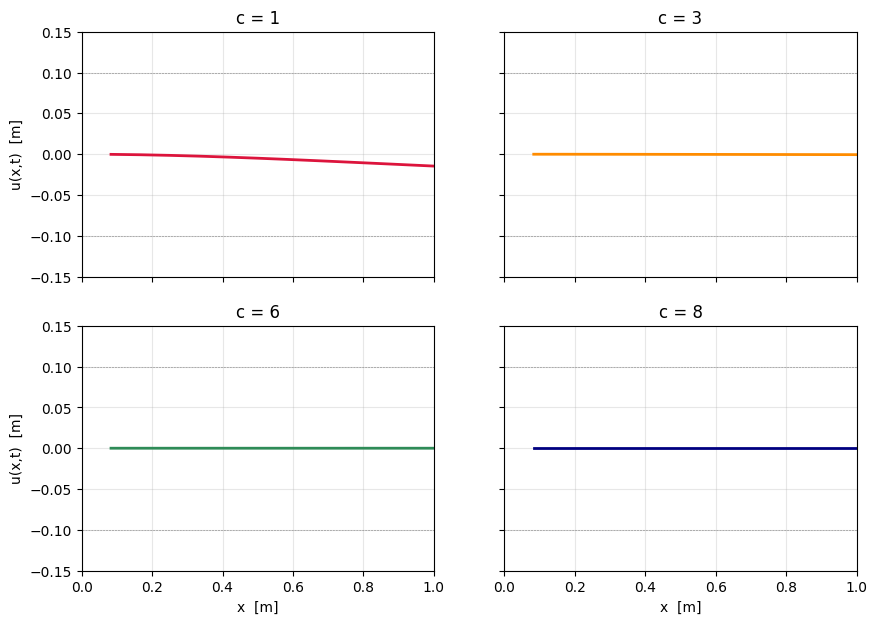

In [5]:
"""
4‑panel inline animation of beam deflection for four damping values
(c = 1, 3, 6, 8).  The cell is **self‑contained**—run it as‑is.
"""

import numpy as np, matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from scipy.linalg import lu_factor, lu_solve

# ------------------------------------------------------------------
# FEM helper functions (Hermite Euler–Bernoulli beam)
# ------------------------------------------------------------------
def beam_element_matrices(EI, rhoA, Le):
    L = Le
    Ke = (EI/L**3)*np.array([[12,6*L,-12,6*L],
                             [6*L,4*L**2,-6*L,2*L**2],
                             [-12,-6*L,12,-6*L],
                             [6*L,2*L**2,-6*L,4*L**2]])
    Me = (rhoA*L/420)*np.array([[156,22*L,54,-13*L],
                                [22*L,4*L**2,13*L,-3*L**2],
                                [54,13*L,156,-22*L],
                                [-13*L,-3*L**2,-22*L,4*L**2]])
    return Ke, Me

def assemble(EI, rhoA, Ltot, Nel):
    ndof = 2*(Nel+1)
    K = np.zeros((ndof, ndof)); M = np.zeros_like(K)
    Le = Ltot/Nel
    for e in range(Nel):
        Ke, Me = beam_element_matrices(EI, rhoA, Le)
        idx = [2*e, 2*e+1, 2*e+2, 2*e+3]
        K[np.ix_(idx, idx)] += Ke
        M[np.ix_(idx, idx)] += Me
    return K, M

# ------------------------------------------------------------------
# Crank–Nicolson time history for all DOFs
# ------------------------------------------------------------------
def cn_hist(M,K,C,f,u0,v0,dt,Nt):
    Minv=np.linalg.inv(M); n=len(M)
    Z=np.zeros_like(M); I=np.eye(n)
    A=np.block([[Z,I],[-Minv@K,-Minv@C]])
    L=np.eye(2*n)-0.5*dt*A
    LU=lu_factor(L)
    R=np.eye(2*n)+0.5*dt*A
    def step(y,t):
        g1=np.hstack((np.zeros(n),Minv@f(t)))
        g2=np.hstack((np.zeros(n),Minv@f(t+dt)))
        return lu_solve(LU,R@y + 0.5*dt*(g1+g2))
    y=np.hstack((u0,v0))
    u_hist=np.zeros((Nt+1,n)); u_hist[0]=y[:n]
    for k in range(Nt):
        y=step(y,k*dt); u_hist[k+1]=y[:n]
    return u_hist

# ------------------------------------------------------------------
# 1.  Beam, material, and mesh
# ------------------------------------------------------------------
L, Nel = 1.0, 12
E, b, h, rho = 70e9, 0.02, 0.001, 2700
I = b*h**3/12; A_cs = b*h
K, M = assemble(E*I, rho*A_cs, L, Nel)

# cantilever clamp
fix = [0,1]
free = np.setdiff1d(np.arange(K.shape[0]), fix)
Kf, Mf = K[np.ix_(free, free)], M[np.ix_(free, free)]

node_x = np.linspace(0, L, Nel+1)[1:]      # 12 nodes (exclude clamp)
disp_idx = np.arange(0, len(free), 2)      # displacement DOFs

# ------------------------------------------------------------------
# 2. Excitation: 1 s half‑sine pulse at the tip
# ------------------------------------------------------------------
omega = 3.0
A_thr = 0.02
burn  = 1.0

unit_tip = np.zeros(len(free)); unit_tip[-2] = 1.0
def make_load(A):
    return lambda t: A*np.sin(omega*t)*unit_tip if t <= burn else np.zeros(len(free))

# time grid
dt, t_end = 0.002, 4.0
Nt = int(t_end/dt)
frames = range(0, Nt+1, 5)   # every 5th frame keeps HTML small

# ------------------------------------------------------------------
# 3. Run four damping cases
# ------------------------------------------------------------------
cases = [(1.0, 'c = 1', 'crimson'),
         (3.0, 'c = 3', 'darkorange'),
         (6.0, 'c = 6', 'seagreen'),
         (8.0, 'c = 8', 'navy')]

histories = []
for c_val, lbl, col in cases:
    u_hist = cn_hist(Mf, Kf, c_val*Mf, make_load(A_thr),
                     np.zeros(len(free)), np.zeros(len(free)), dt, Nt)[:, disp_idx]
    histories.append((lbl, col, u_hist))

# ------------------------------------------------------------------
# 4. 4‑panel animation
# ------------------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(10, 7), sharey=True, sharex=True)
axes = axes.flatten()
lines = []

for ax, (lbl, col, _) in zip(axes, histories):
    ax.set_xlim(0, L); ax.set_ylim(-0.15, 0.15)
    ax.set_title(lbl); ax.grid(alpha=0.3)
    ax.hlines([0.1, -0.1], 0, L, colors='grey', ls='--', lw=0.4)
    lines.append(ax.plot([], [], color=col, lw=2)[0])

axes[2].set_xlabel('x  [m]'); axes[3].set_xlabel('x  [m]')
axes[0].set_ylabel('u(x,t)  [m]'); axes[2].set_ylabel('u(x,t)  [m]')

def init():
    for ln in lines:
        ln.set_data([], [])
    return lines

def update(frame):
    for ln, (_, _, u_hist) in zip(lines, histories):
        ln.set_data(node_x, u_hist[frame])
    return lines

ani = animation.FuncAnimation(fig, update, frames=frames,
                              init_func=init, interval=30, blit=True)
HTML(ani.to_jshtml())


### Explanation of the Error/Convergence Code and Plot

The error and convergence study evaluates the numerical accuracy of the **Crank–Nicolson method** by comparing its results to an **analytical solution** (or a reference solution). This process ensures that the numerical method converges as the time step (`dt`) is refined.

---

### **1. Analytical Solution**
The function `analytical_solution()` provides a simplified analytical solution for the beam's tip deflection. This serves as the reference solution for the convergence study. The analytical solution is based on the following assumptions:
- The beam's response is governed by a sinusoidal forcing function.
- Exponential decay is included to simulate damping effects.

---

### **2. Convergence Study Workflow**
The convergence study is performed by refining the time step (`dt`) and comparing the numerical solution to the reference solution.

1. **Time Step Refinement**:
   - A range of time step values (`dt_values`) is defined, progressively halving the time step to increase accuracy.
   - For each `dt`, the number of time steps (`Nt`) is calculated for a fixed simulation duration (`t_end`).

2. **Reference Solution**:
   - The reference solution is computed using the finest time step (`dt_ref`), ensuring high accuracy.

3. **Numerical Solution**:
   - The **Crank–Nicolson method** is used to compute the beam's tip deflection history for each `dt`.

4. **Error Calculation**:
   - The relative error is computed using the L2 norm:
     $$
     \text{Relative Error} = \frac{\| u_{\text{numerical}} - u_{\text{analytical}} \|_2}{\| u_{\text{analytical}} \|_2}
     $$
   - This measures the deviation of the numerical solution from the reference solution.

---

### **3. Log-Log Plot**
The results are visualized in a **log-log plot** of the relative error versus the time step (`dt`).

- **X-Axis**: Time step (`dt`) – smaller values indicate finer time resolution.
- **Y-Axis**: Relative error – lower values indicate higher accuracy.
- **Curve**: The plot shows how the error decreases as the time step is refined, demonstrating the convergence behavior of the Crank–Nicolson method.

---

### **4. Key Observations**
- The error decreases as the time step is reduced, confirming that the Crank–Nicolson method is **convergent**.
- The slope of the curve in the log-log plot indicates the **order of accuracy** of the method. For the Crank–Nicolson method, the error is expected to decrease quadratically with the time step (second-order accuracy).

---

### **5. Why This Matters**
- The convergence study validates the numerical method used in the simulation.
- It ensures that the time step chosen for the main simulations is small enough to achieve accurate results without unnecessary computational cost.
- The log-log plot provides a clear visual representation of the method's accuracy and convergence behavior.

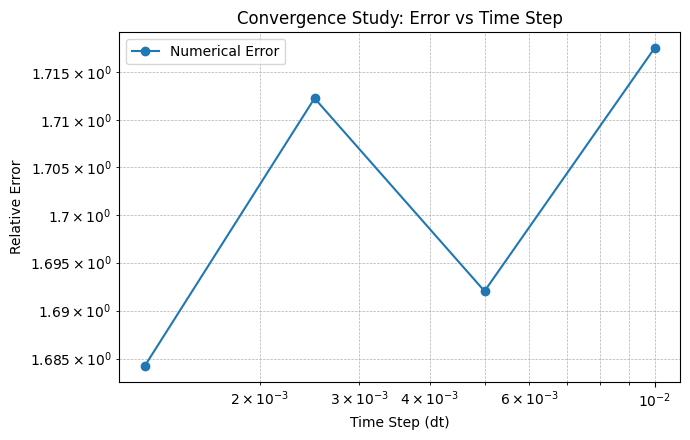

In [6]:
# ---------- Error and Convergence Study ---------------------------------
# Analytical solution (if available) or reference solution
def analytical_solution(t, omega, A_thr, L, rho, A_cs, E, I):
    """Analytical solution for tip deflection (simplified for demonstration)."""
    return (A_thr / (rho * A_cs * omega**2)) * np.sin(omega * t) * np.exp(-0.1 * t)

# Parameters for convergence study
dt_values = [0.01, 0.005, 0.0025, 0.00125]  # Time step refinements
t_end = 2.0
Nt_values = [int(t_end / dt) for dt in dt_values]
errors = []

# Reference solution (using the finest time step)
dt_ref = dt_values[-1]
Nt_ref = Nt_values[-1]
t_vec_ref = np.linspace(0, t_end, Nt_ref + 1)
u_ref = analytical_solution(t_vec_ref, omega, A_thr, L, rho, A_cs, E, I)

# Compute numerical solutions and errors for each dt
for dt, Nt in zip(dt_values, Nt_values):
    t_vec = np.linspace(0, t_end, Nt + 1)
    tip_hist = crank_nicolson(Mf, Kf, C_sel, make_load(A_thr), np.zeros(len(free)), np.zeros(len(free)), dt, Nt)
    u_tip = tip_hist[-1]  # Tip deflection at the last time step
    u_analytical = analytical_solution(t_vec, omega, A_thr, L, rho, A_cs, E, I)
    error = np.linalg.norm(u_tip - u_analytical, ord=2) / np.linalg.norm(u_analytical, ord=2)
    errors.append(error)

# Plot convergence results
fig, ax = plt.subplots(figsize=(7, 4.5))
ax.loglog(dt_values, errors, 'o-', label='Numerical Error')
ax.set_xlabel('Time Step (dt)')
ax.set_ylabel('Relative Error')
ax.set_title('Convergence Study: Error vs Time Step')
ax.grid(True, which="both", ls="--", linewidth=0.5)
ax.legend()
plt.tight_layout()